In [2]:
import os
import numpy as np
import torch
import scipy.io as sio
from torch.utils.data import DataLoader, TensorDataset

# LSTM Model definition
class LSTM(torch.nn.Module):
    def __init__(self):
        super(LSTM, self).__init__()
        self.lstm = torch.nn.LSTM(
            input_size=6,
            hidden_size=90,
            num_layers=4,
            batch_first=True,
            dropout=0.0,
            bidirectional=False,
        )  
        self.fc = torch.nn.Linear(90, 2)

    def forward(self, x, h=None):
        batch_size = x.size(0)  # Get batch size from input
        if h is None:
            h_n = x.new_zeros((4, batch_size, 90), device=x.device)  # Move to same device as input
            h_c = x.new_zeros((4, batch_size, 90), device=x.device)
        else:
            h_n, h_c = h

        self.lstm.flatten_parameters()
        r_out, (h_n, h_c) = self.lstm(x, (h_n, h_c))
        output = self.fc(r_out[:, -1, :])  # Use the last time step
        return output

# Function to load the data from .mat files
def load_data_from_mat(file_path):
    data = sio.loadmat(file_path)
    imu = data['imu']  # 6 IMU columns (linear_acceleration and angular_velocity)

    # Extract best_detector and ensure it's handled correctly as a string
    best_detector = data['best_detector'][0]  # Extract as a string
    
    # Mapping the best detector to the respective zv variable
    if best_detector == 'vicon':
        labels = data['zv_vicon_opt'].flatten()
    elif best_detector == 'amvd':
        labels = data['zv_amvd_opt'].flatten()
    elif best_detector == 'ared':
        labels = data['zv_ared_opt'].flatten()
    elif best_detector == 'mbgtd':
        labels = data['zv_mbgtd_opt'].flatten()
    elif best_detector == 'shoe':
        labels = data['zv_shoe_opt'].flatten()
    else:
        raise ValueError("Unknown best detector: " + str(best_detector))
    
    return imu, labels

# Prepare the dataset for training
def prepare_data(data_dir, window_size=50):
    data = []
    labels = []
    # we would like to exclude crawling & ladder-climbing data for stride-detection accuracy purposes
    i = 0 # experiment index
    # WARNING: WE NEED TO CORRECT FOR THE CROPPING INDEXES OF THE FOLLOWING EXPERIMENTS: END WITH 1S AND START WITH 1S
    # 4th experiment: 10th stride (8th from the end) is missed in GT data: Split it into two as [0:2650] & [2950:end] (exclude 300 samples in training)
    # 6th experiment: 9th stride (start counting the strides while going to south) is not detected as a stride in GT data: Split it into two as [0:2400] & [2700:end]
    # 11th experiment: 7th stride (see above for explanation): Split it into two as [0:2000] & [2300:end] (exclude 300 samples)
    # 13th experiments is annotated as NOT BIPEDAL LOCOMOTION motion yet requires further examination
    # 16th experiments' ZV plot looks like the experiment is crawling motion - NOT BIPEDAL LOCOMOTION TRAINING DATA
    # 18th experiment: 7th stride is missed - check for [1700-2165] region for the stride
    # 20th experiment is ambiguous so it is not considered as training data
    # 27th experiment: missed strides {9, 16, 17, 18}. First three strides can be retrieved by VICON detector while the last one can be retrieved by MBGTD.
    # 30th experiment: missed strides {2, 10}. Both strides are detected by SHOE detector
    stride_experiment = [1, 1, 1, -1, 1, -1, 1, 1, 1, 1, -1, 1, 0, 1, 1, 
                         0, 1, -1, 1, 0, 1, 1, 1, 1, 1, 1, -1, 1, 1, -1]
    # Loop through all .mat files in the directory
    for root, dirs, files in os.walk(data_dir):
        for file in files:
            if file.endswith('.mat') and stride_experiment[i]:
                file_path = os.path.join(root, file)
                imu_data, label_data = load_data_from_mat(file_path)
                
                # Split data into sequences of size window_size
                for i in range(len(imu_data) - window_size):
                    window = imu_data[i:i+window_size]
                    label_window = label_data[i+window_size-1]  # Predict the label for the last time step
                    data.append(window)
                    labels.append(label_window)

    data = np.array(data)
    labels = np.array(labels)  # Make sure labels are 1D (target for each sequence)
    
    return data, labels

# Function to train the LSTM model with early stopping
def train_model(data, labels, batch_size=64, epochs=100, patience=5):
    # Check if GPU is available and set the device accordingly
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    print(f"Using device: {device}")

    # Create TensorDataset and DataLoader
    dataset = TensorDataset(torch.tensor(data, dtype=torch.float32), torch.tensor(labels, dtype=torch.long))
    loader = DataLoader(dataset, batch_size=batch_size, shuffle=True)

    # Initialize LSTM model
    model = LSTM().to(device)
    optimizer = torch.optim.Adam(model.parameters(), lr=0.001)
    criterion = torch.nn.CrossEntropyLoss()

    best_loss = float('inf')
    epochs_no_improve = 0
    early_stop = False

    # Training loop with early stopping
    for epoch in range(epochs):
        model.train()
        running_loss = 0.0
        for inputs, targets in loader:
            inputs, targets = inputs.to(device), targets.to(device)  # Move inputs and targets to the GPU

            optimizer.zero_grad()
            outputs = model(inputs)  # Inputs are now batched correctly
            loss = criterion(outputs, targets)  # Targets are now 1D for each sequence
            loss.backward()
            optimizer.step()

            running_loss += loss.item()

        avg_loss = running_loss / len(loader)
        print(f"Epoch {epoch+1}/{epochs}, Loss: {avg_loss}")

        # Early stopping logic
        if avg_loss < best_loss:
            best_loss = avg_loss
            epochs_no_improve = 0
            torch.save(model.state_dict(), 'lstm_trained_model.pth')  # Save the best model
        else:
            epochs_no_improve += 1

        if epochs_no_improve == patience:
            print("Early stopping triggered")
            early_stop = True
            break

    if not early_stop:
        torch.save(model.state_dict(), 'lstm_trained_model.pth')

# Main function to prepare the data and train the model
def main():
    vicon_data_dir = 'C:/Users/gokhan/pyshoe-master/pyshoe-master/data/vicon/processed'
    
    # Prepare data
    data, labels = prepare_data(vicon_data_dir, window_size=50)

    # Train the model with early stopping
    train_model(data, labels, batch_size=64, epochs=1000, patience=5)

if __name__ == "__main__":
    main()


Using device: cuda
Epoch 1/1000, Loss: 0.21060977694196778
Epoch 2/1000, Loss: 0.16101358760665777
Epoch 3/1000, Loss: 0.13580453610618223
Epoch 4/1000, Loss: 0.12388157311158385
Epoch 5/1000, Loss: 0.10736304072621403
Epoch 6/1000, Loss: 0.09862609959888088
Epoch 7/1000, Loss: 0.09081332966471549
Epoch 8/1000, Loss: 0.08453691948472014
Epoch 9/1000, Loss: 0.07671306392120084
Epoch 10/1000, Loss: 0.07191323530313827
Epoch 11/1000, Loss: 0.06783401485636181
Epoch 12/1000, Loss: 0.06356608462369277
Epoch 13/1000, Loss: 0.059856724471550486
Epoch 14/1000, Loss: 0.057147371909875226
Epoch 15/1000, Loss: 0.054261273975067026
Epoch 16/1000, Loss: 0.051763021339488804
Epoch 17/1000, Loss: 0.0524767450231342
Epoch 18/1000, Loss: 0.04861721045153201
Epoch 19/1000, Loss: 0.047457891583785806
Epoch 20/1000, Loss: 0.04560657231482887
Epoch 21/1000, Loss: 0.044442126323656614
Epoch 22/1000, Loss: 0.04346524282182608
Epoch 23/1000, Loss: 0.042248070645068726
Epoch 24/1000, Loss: 0.04052392226608504


Using device: cuda


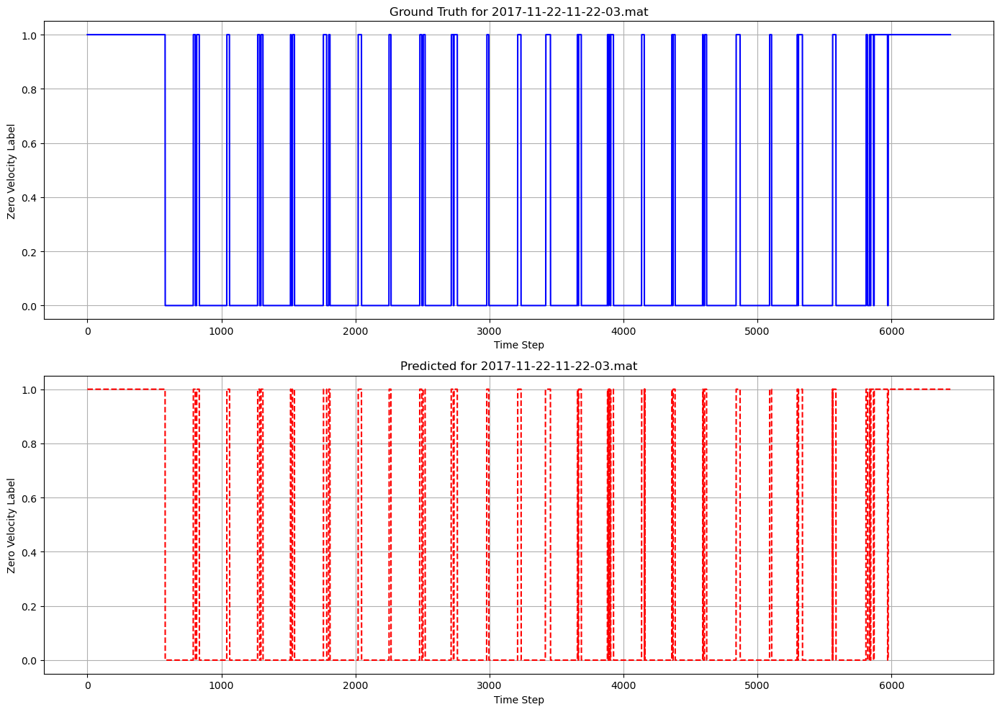

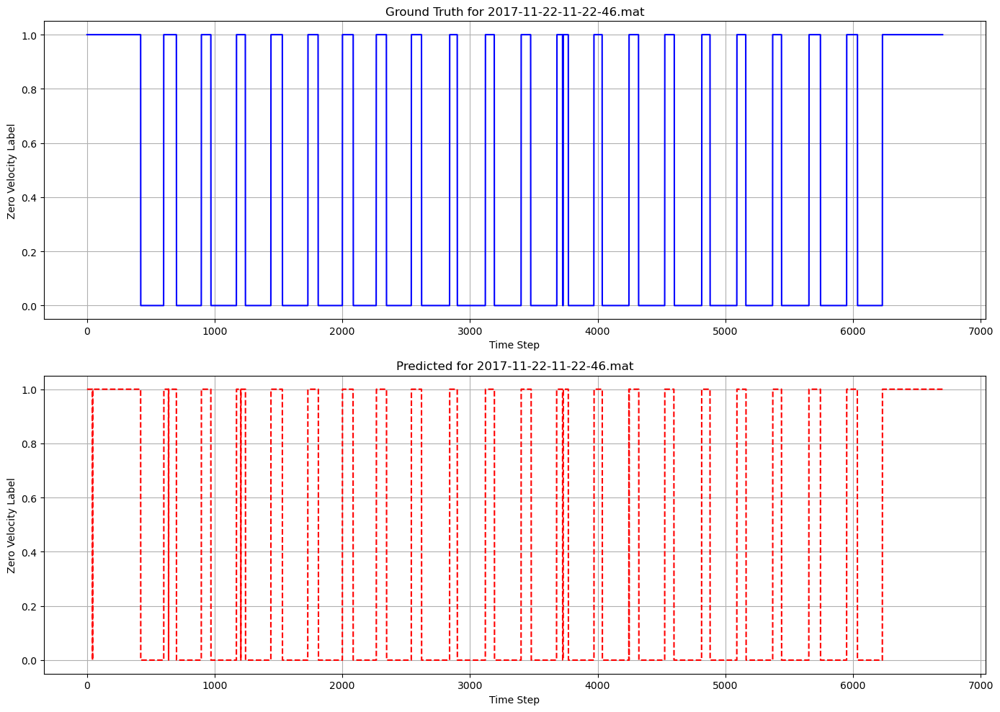

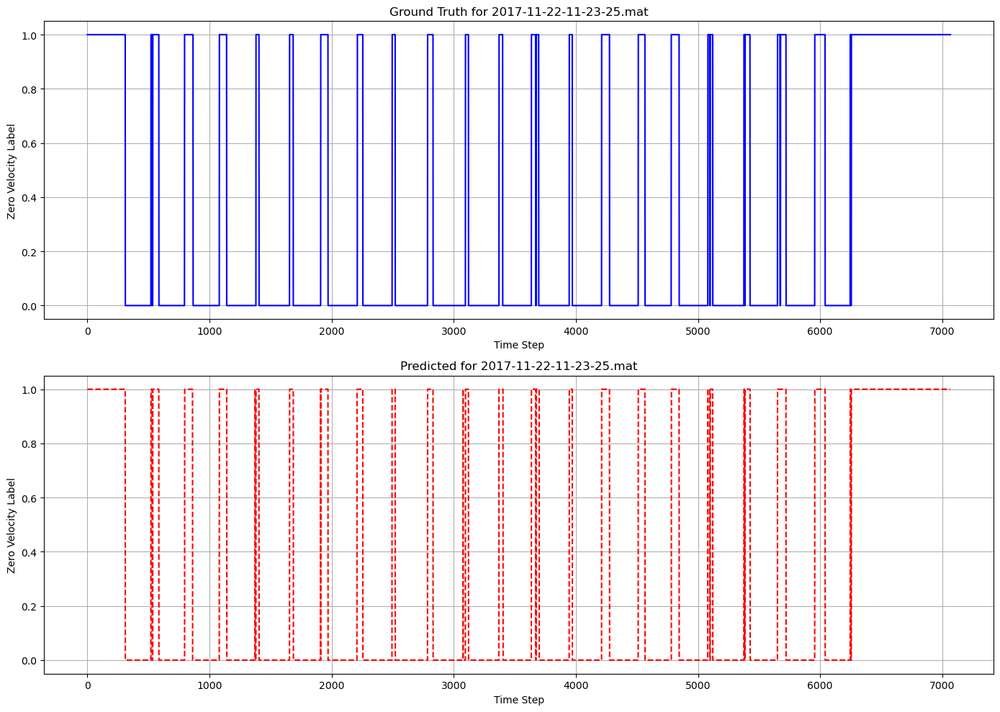

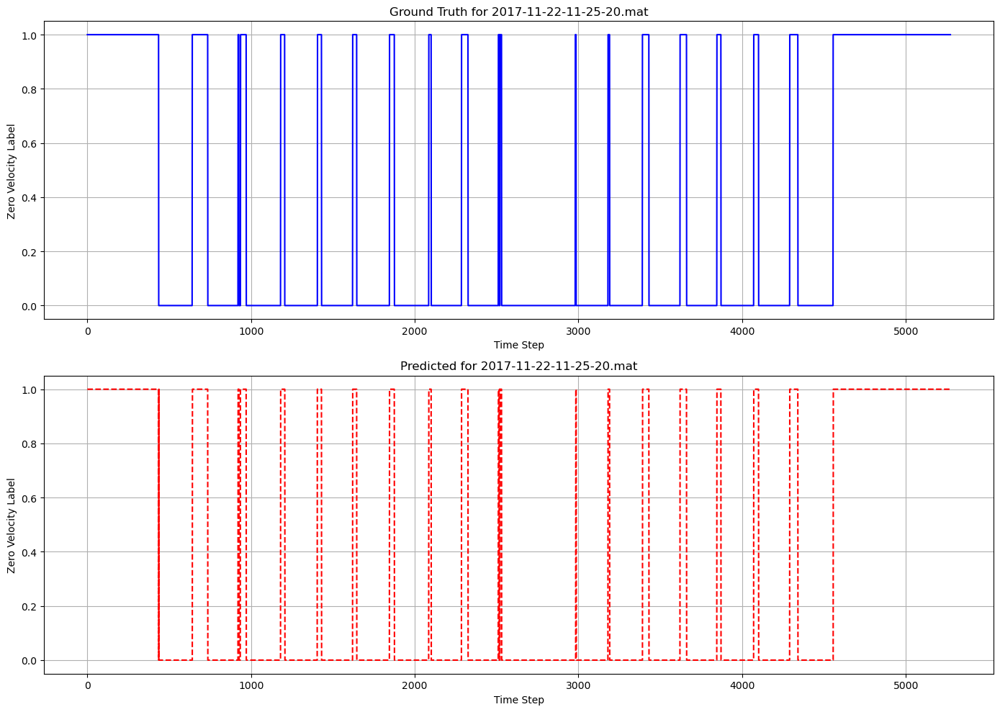

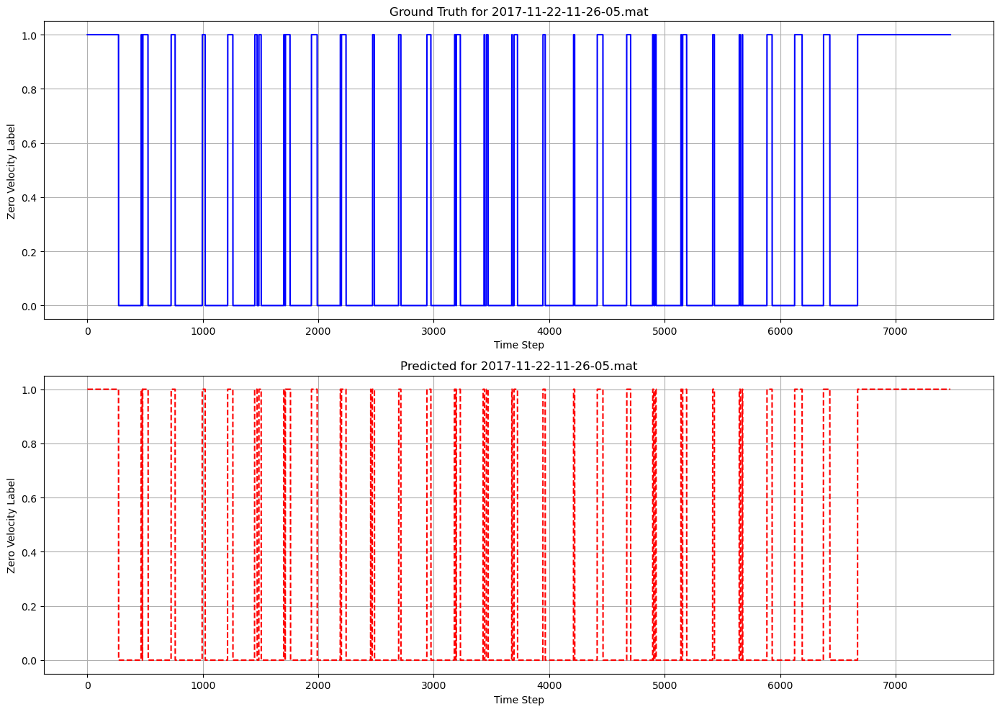

...

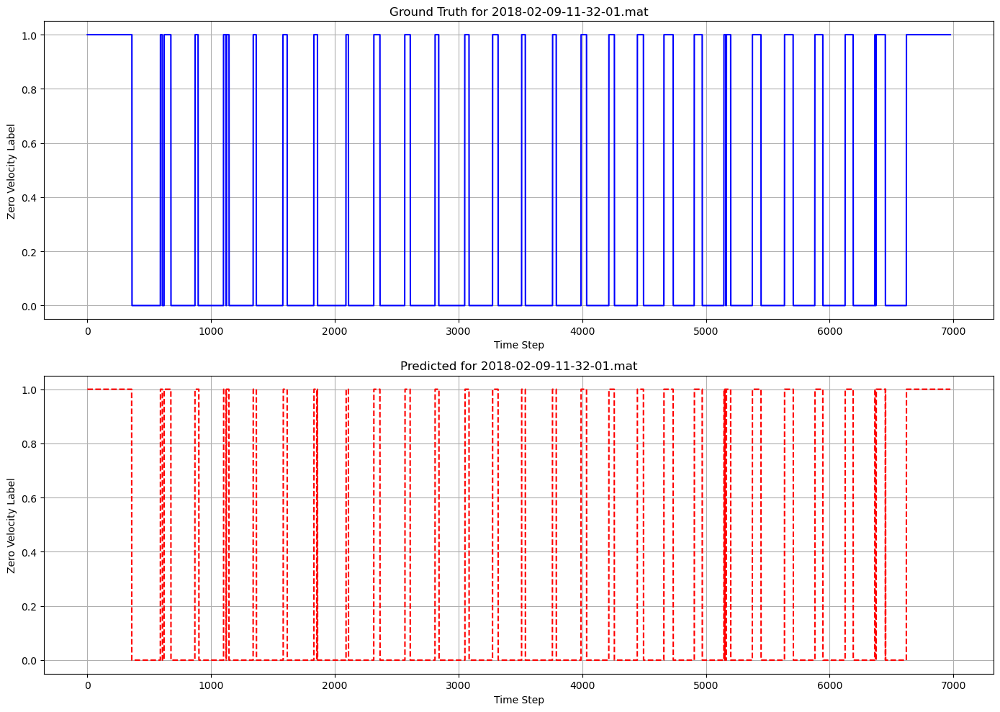

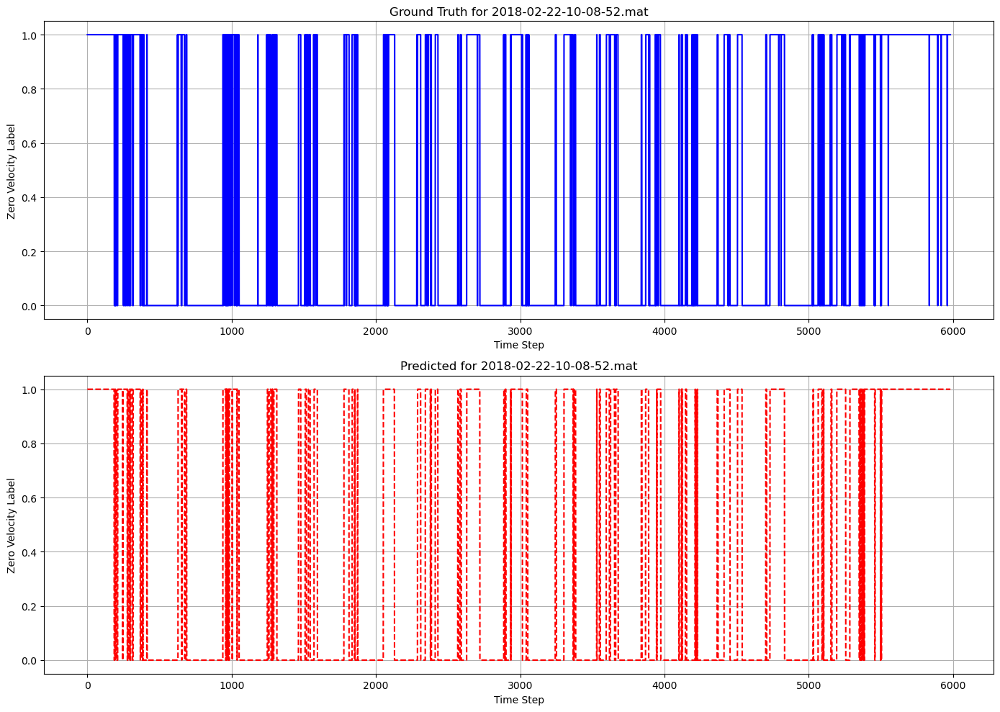

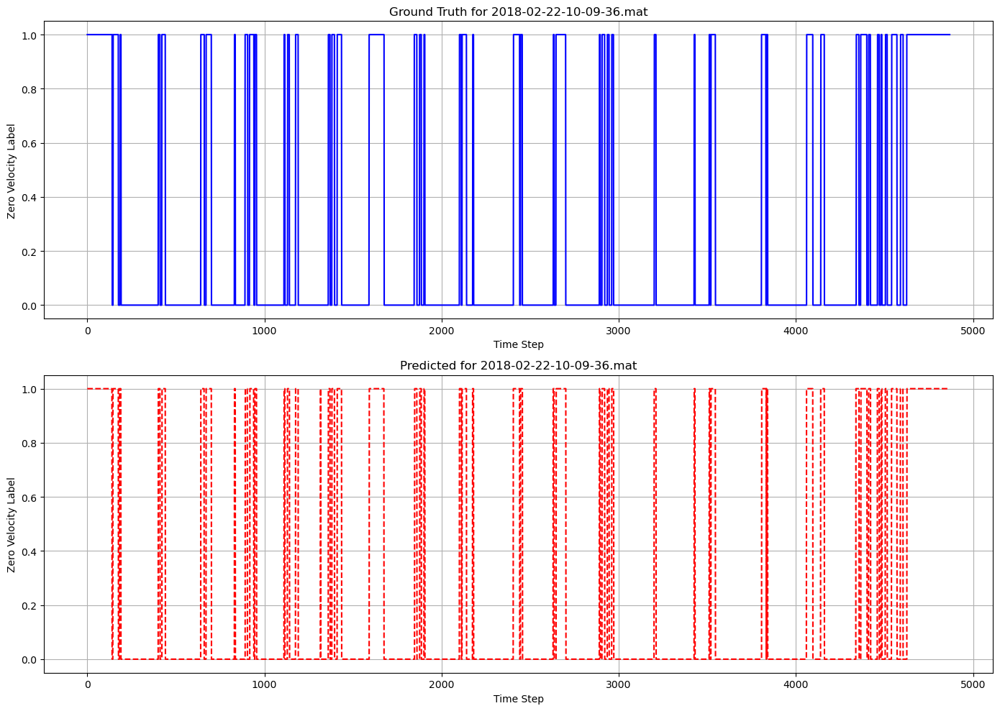

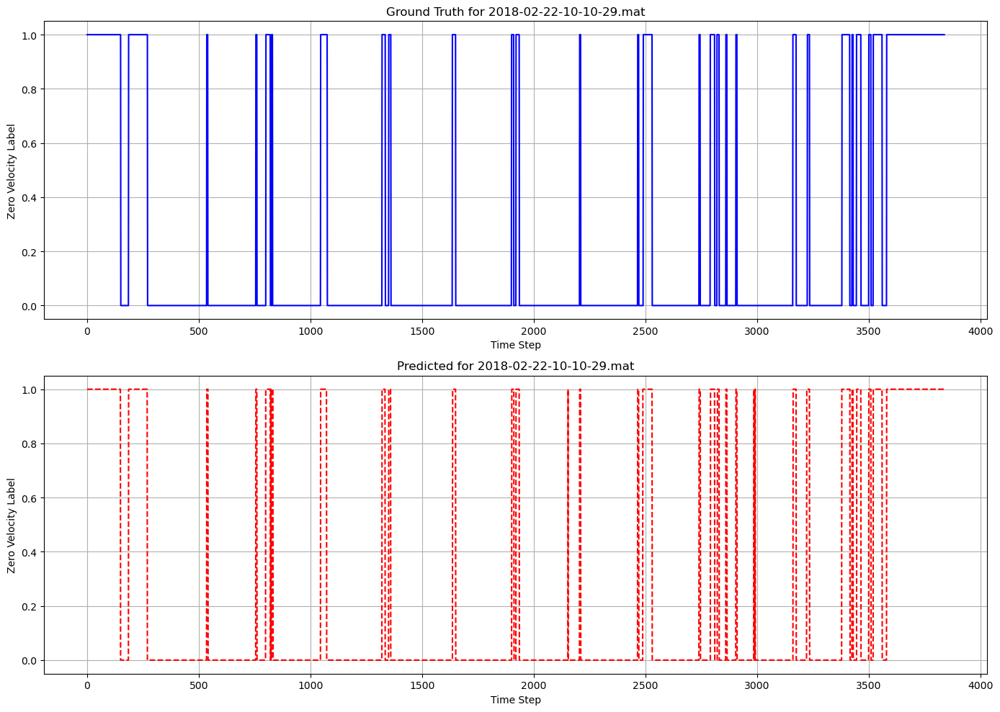

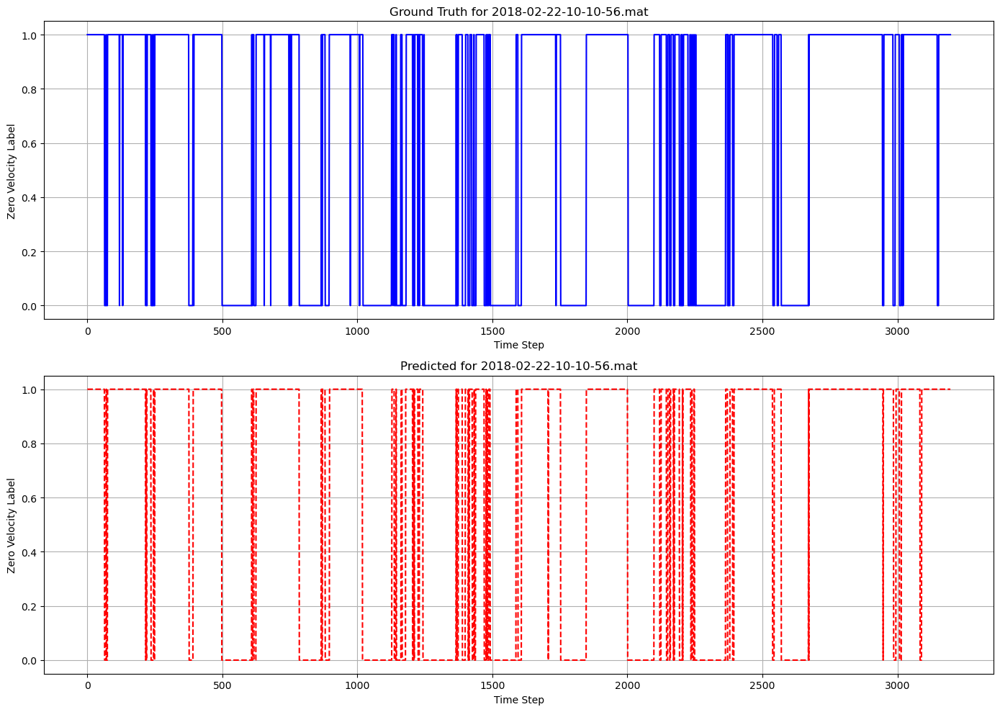

In [3]:
import os
import numpy as np
import torch
import scipy.io as sio
import matplotlib.pyplot as plt
from torch.utils.data import DataLoader, TensorDataset

# LSTM Model definition
class LSTM(torch.nn.Module):
    def __init__(self):
        super(LSTM, self).__init__()
        self.lstm = torch.nn.LSTM(
            input_size=6,
            hidden_size=90,
            num_layers=4,
            batch_first=True,
            dropout=0.0,
            bidirectional=False,
        )  
        self.fc = torch.nn.Linear(90, 2)

    def forward(self, x, h=None):
        batch_size = x.size(0)  # Get batch size from input
        if h is None:
            h_n = x.new_zeros((4, batch_size, 90), device=x.device)  # Move to the same device as input
            h_c = x.new_zeros((4, batch_size, 90), device=x.device)
        else:
            h_n, h_c = h

        self.lstm.flatten_parameters()
        r_out, (h_n, h_c) = self.lstm(x, (h_n, h_c))
        output = self.fc(r_out[:, -1, :])  # Use the last time step
        return output

# Function to load the data from .mat files
def load_data_from_mat(file_path):
    data = sio.loadmat(file_path)
    imu = data['imu']  # 6 IMU columns (linear_acceleration and angular_velocity)

    # Ensure the best_detector is extracted properly as a string
    best_detector = data['best_detector']
    if isinstance(best_detector, np.ndarray):
        best_detector = best_detector[0]  # Extract the first element if it is a nested array
    if isinstance(best_detector, np.ndarray):
        best_detector = best_detector[0]  # Extract if still an array
    best_detector = str(best_detector)  # Ensure it is converted to a string
    
    # Mapping the best detector to the respective zv variable
    if best_detector == 'vicon':
        labels = data['zv_vicon_opt'].flatten()
    elif best_detector == 'amvd':
        labels = data['zv_amvd_opt'].flatten()
    elif best_detector == 'ared':
        labels = data['zv_ared_opt'].flatten()
    elif best_detector == 'mbgtd':
        labels = data['zv_mbgtd_opt'].flatten()
    elif best_detector == 'shoe':
        labels = data['zv_shoe_opt'].flatten()
    else:
        raise ValueError(f"Unknown best detector: {best_detector}")
    
    return imu, labels

# Prepare data for prediction
def prepare_data_for_prediction(data_dir, window_size=50):
    data = []
    labels = []
    file_paths = []
    num_data_points_per_file = []

    # Loop through all .mat files in the directory
    for root, dirs, files in os.walk(data_dir):
        for file in files:
            if file.endswith('.mat'):
                file_path = os.path.join(root, file)
                imu_data, label_data = load_data_from_mat(file_path)
                
                # Split data into sequences of size window_size
                num_data_points = len(imu_data) - window_size
                num_data_points_per_file.append(num_data_points)
                
                for i in range(num_data_points):
                    window = imu_data[i:i+window_size]
                    label_window = label_data[i+window_size-1]  # Predict the label for the last time step
                    data.append(window)
                    labels.append(label_window)
                
                # Keep track of the file paths for plotting later
                file_paths.append(file_path)

    data = np.array(data)
    labels = np.array(labels)  # Ensure labels are 1D (target for each sequence)
    
    return data, labels, file_paths, num_data_points_per_file

# Predict using the pretrained model in batches to avoid memory issues
def predict_in_batches(model, data, batch_size, device):
    model = model.to(device)
    model.eval()

    predictions = []
    data_loader = DataLoader(torch.tensor(data, dtype=torch.float32), batch_size=batch_size)

    with torch.no_grad():
        for batch in data_loader:
            batch = batch.to(device)
            outputs = model(batch)
            predicted_labels = torch.argmax(outputs, dim=1).cpu().numpy()  # Move back to CPU for numpy
            predictions.append(predicted_labels)

    return np.concatenate(predictions)

# Function to plot predictions vs. ground truth as subplots
def plot_predictions(file_path, predicted_labels, ground_truth_labels):
    plt.figure(figsize=(14, 10))
    
    # Subplot for ground truth
    plt.subplot(2, 1, 1)
    plt.plot(ground_truth_labels, label='Ground Truth', color='blue')
    plt.title(f'Ground Truth for {os.path.basename(file_path)}')
    plt.xlabel('Time Step')
    plt.ylabel('Zero Velocity Label')
    plt.grid(True)

    # Subplot for predicted labels
    plt.subplot(2, 1, 2)
    plt.plot(predicted_labels, label='Predicted', color='red', linestyle='--')
    plt.title(f'Predicted for {os.path.basename(file_path)}')
    plt.xlabel('Time Step')
    plt.ylabel('Zero Velocity Label')
    plt.grid(True)

    plt.tight_layout()
    plt.show()

# Main function to load the model, predict, and plot for each dataset
def main():
    # Load the pretrained model
    model = LSTM()
    model.load_state_dict(torch.load('lstm_trained_model.pth'))

    # Check if GPU is available
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    print(f"Using device: {device}")

    vicon_data_dir = 'C:/Users/gokhan/pyshoe-master/pyshoe-master/data/vicon/processed'
    
    # Prepare data for prediction
    data, labels, file_paths, num_data_points_per_file = prepare_data_for_prediction(vicon_data_dir, window_size=50)

    # Batch size for prediction to avoid out-of-memory error
    batch_size = 512  # You can adjust this based on GPU memory

    # Predict using the pretrained model in batches
    predicted_labels = predict_in_batches(model, data, batch_size, device)

    # Plot predictions for each file
    start_idx = 0
    for i, file_path in enumerate(file_paths):
        num_data_points = num_data_points_per_file[i]
        end_idx = start_idx + num_data_points
        plot_predictions(file_path, predicted_labels[start_idx:end_idx], labels[start_idx:end_idx])
        start_idx = end_idx

if __name__ == "__main__":
    main()
